In [1]:
# %matplotlib notebook
%load_ext autoreload
%autoreload 2

In [2]:
import os, sys

module_path = os.path.abspath(os.path.join("../.."))
sys.path.append(module_path)

## Dataset and hyperparameters loading

In [3]:
from torchvision.transforms.v2 import Compose
from hyperparameters import load_hyperparameters_from_json

from SLTDataset import SLTDataset
from posecraft.Pose import Pose


DATASET = "GSL"
EXPERIMENT_ID = "happy-salad-43"
SAMPLE_IDX = 0

dataset_path = f"/mnt/disk3Tb/slt-datasets/{DATASET}"
experiment_path = f"results/{DATASET}/{EXPERIMENT_ID}"
hp = load_hyperparameters_from_json(f"{experiment_path}/hp.json")
output_path = f"{experiment_path}/interp/{SAMPLE_IDX}/"
os.makedirs(output_path, exist_ok=True)
transparent_plot = False
decoder_attn_weights_layer = 0

landmarks_mask = Pose.get_components_mask(hp["LANDMARKS_USED"])
transforms: Compose = Compose(hp["TRANSFORMS"])

test_dataset = SLTDataset(
    data_dir=dataset_path,
    split="test",
    input_mode=hp["INPUT_MODE"],
    output_mode=hp["OUTPUT_MODE"],
    transforms=transforms,
    max_tokens=hp["MAX_TOKENS"],
)

Loaded metadata for dataset: The Greek Sign Language (GSL) Dataset
Loaded test annotations at /mnt/disk3Tb/slt-datasets/GSL/annotations.csv


Validating files: 100%|██████████| 881/881 [00:00<00:00, 237785.19it/s]

Dataset loaded correctly



### Display sample

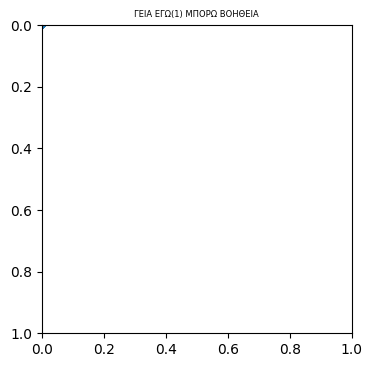

In [4]:
from IPython.display import HTML

# avoid using the last transform as it flattens the keypoints
visual_transforms: Compose = Compose(hp["TRANSFORMS"][:-1])
anim = test_dataset.visualize_pose(SAMPLE_IDX, transforms=visual_transforms)
HTML(anim.to_jshtml())

In [5]:
anim.save(f"{output_path}/sample.mp4", writer="ffmpeg")

### Interpretability

In [6]:
from torch import Tensor
import pickle

from interp.plot_functions import plot_encoder_layers, plot_decoder_layers


encoder_sa: dict[int, dict[int, list[Tensor]]] = pickle.load(
    open(f"{experiment_path}/interp/encoder_sa.pkl", "rb")
)
decoder_sa: dict[int, dict[int, list[Tensor]]] = pickle.load(
    open(f"{experiment_path}/interp/decoder_sa.pkl", "rb")
)
decoder_ca: dict[int, dict[int, list[Tensor]]] = pickle.load(
    open(f"{experiment_path}/interp/decoder_ca.pkl", "rb")
)

#### Encoder Self-Attention

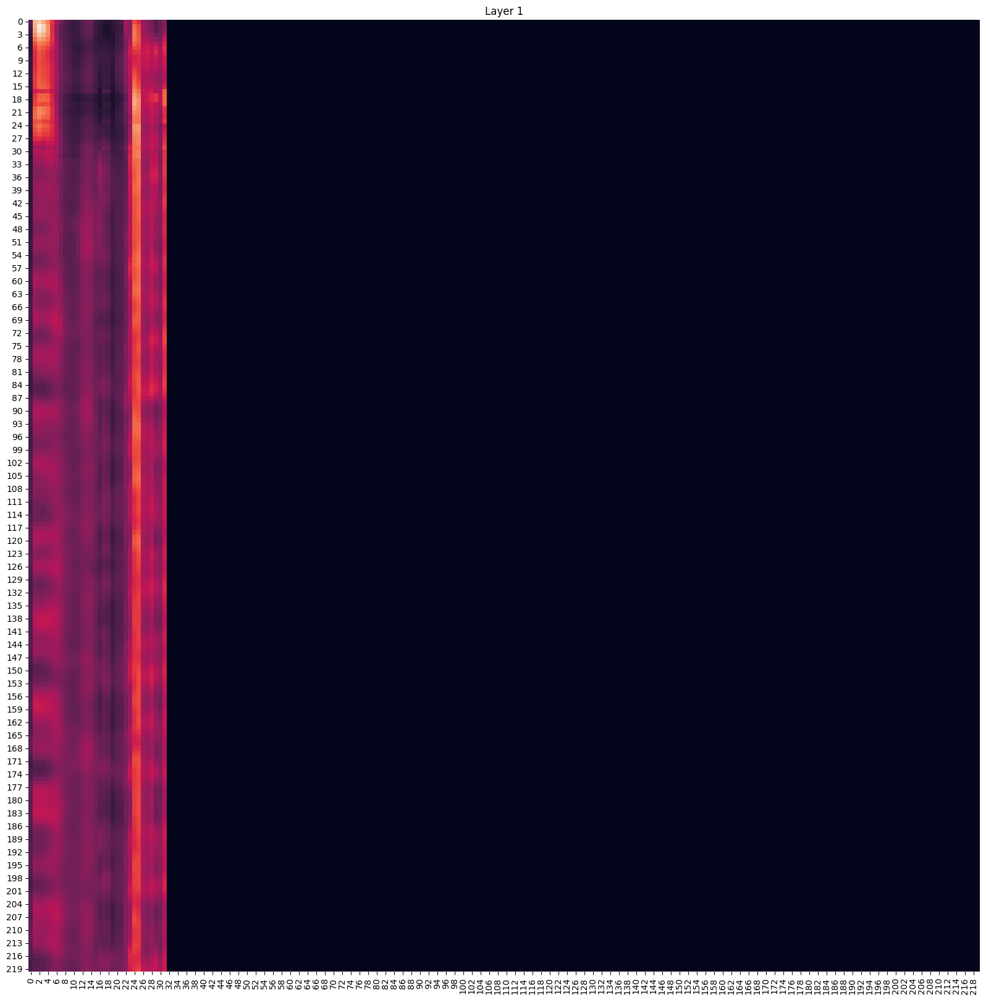

In [7]:
attn_output_weights = [t[0].squeeze() for t in encoder_sa[SAMPLE_IDX].values()]
fig, ax = plot_encoder_layers(
    attn_output_weights, hp, output_path, transparent=transparent_plot
)

#### Decoder Self-Attention

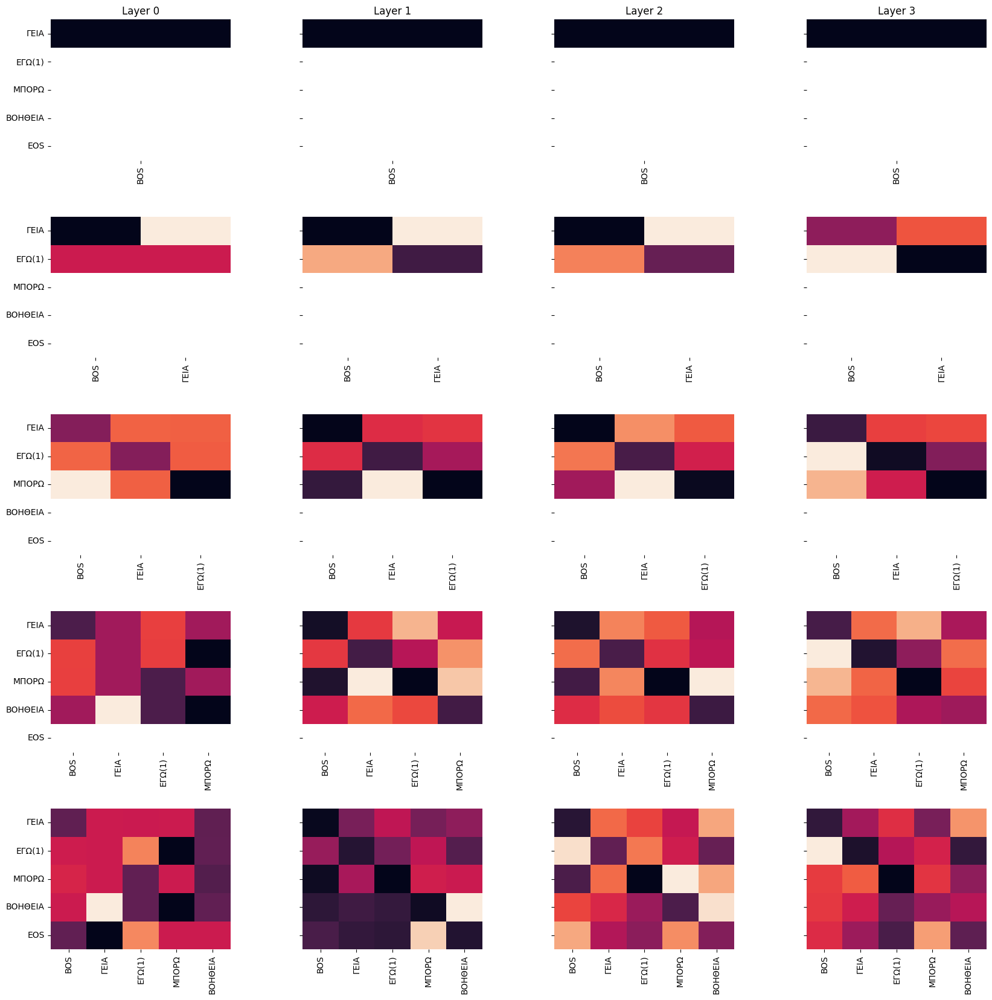

In [8]:
src, tgt = test_dataset[SAMPLE_IDX]

fig, ax = plot_decoder_layers(
    decoder_sa[SAMPLE_IDX],
    hp,
    test_dataset.tokenizer.convert_ids_to_tokens(
        [t for t in tgt.tolist() if t != test_dataset.tokenizer.pad_token_id]
    ),
    "self",
    output_path,
    transparent=transparent_plot,
)

#### Decoder Cross-Attention

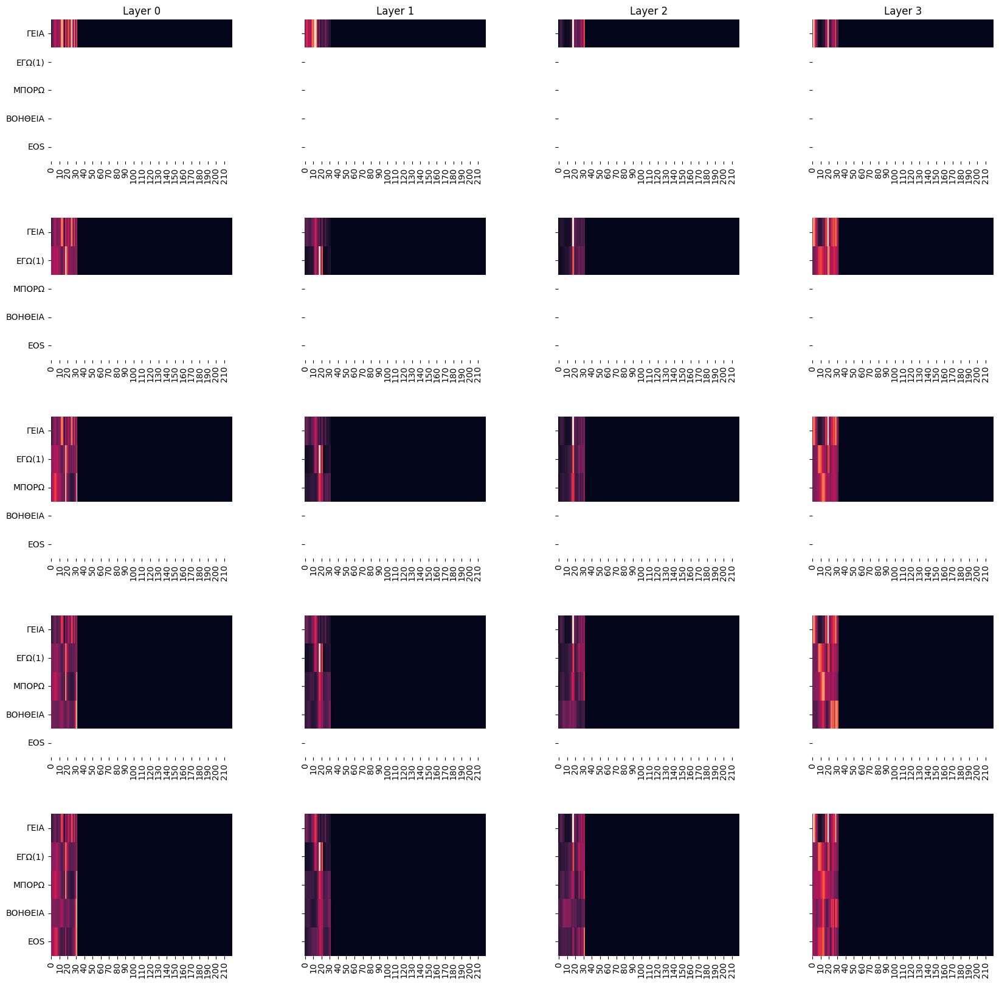

In [9]:
fig, ax = plot_decoder_layers(
    decoder_ca[SAMPLE_IDX],
    hp,
    test_dataset.tokenizer.convert_ids_to_tokens(
        [t for t in tgt.tolist() if t != test_dataset.tokenizer.pad_token_id]
    ),
    "cross",
    output_path,
    transparent=transparent_plot,
)

### Plotting

In [19]:
norm_min_max_lambda = lambda t: (t - t.min()) / (t.max() - t.min())

In [20]:
for mode in ["heatmap", "lineplot"]:
    attn_weights = plot_decoder_attn_weights(
        attn_output_weights_list,
        hp,
        output_path,
        translation,
        decoder_attn_weights_layer,
        norm_min_max_lambda,
        mode,
        transparent_plot,
        {"square": True, "cbar": False},
    )

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [21]:
anim = plot_decoder_attn_weights_bars(
    src.cpu(), attn_weights, hp, output_path, translation, decoder_attn_weights_layer
)

<IPython.core.display.Javascript object>

In [22]:
HTML(anim.to_jshtml())

#### Decoder `sa_block` & `mha_block`

In [23]:
from interp.InterpTransformer import clear_intermediate_outputs

In [24]:
clear_intermediate_outputs()

In [25]:
translator.greedy_decode(src, model, BOS_IDX, EOS_IDX)

tensor([[  2, 150, 237, 116,  89,   3]], device='cuda:0')

In [26]:
from interp.InterpTransformer import intermediate_outputs

In [27]:
intermediate_outputs = {
    key: [tensor[0].cpu().detach().numpy() for tensor in value]
    for key, value in intermediate_outputs.items()
}

In [28]:
plot_intermediate_outputs(
    intermediate_outputs, hp, output_path, translation, transparent_plot
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [29]:
diff_sa_mha_block = []
for t1, t2 in zip(intermediate_outputs["sa_block"], intermediate_outputs["mha_block"]):
    diff = t1 - t2

    # normalize to [-1,1]
    diff -= diff.min()
    diff /= diff.max()
    diff *= 2
    diff -= 1

    diff_sa_mha_block.append(diff)
diff_sa_mha_block = {"diff_sa_block_mha_block": diff_sa_mha_block}

In [30]:
plot_intermediate_outputs(
    diff_sa_mha_block, hp, output_path, translation, transparent_plot
)

<IPython.core.display.Javascript object>

In [31]:
tgt_length = len(translation) - 1  # from BOS to EOS-1
attn_output_weights_list = reorganize_list(
    diff_sa_mha_block["diff_sa_block_mha_block"], hp["NUM_DECODER_LAYERS"]
)
for i in range(0, len(attn_output_weights_list), tgt_length):
    print(f"Layer {i // tgt_length + 1}:")
    for j in range(i, i + tgt_length):
        w = attn_output_weights_list[j]
        print(f"{w.shape} → {w.mean():>7.3f}")

Layer 1:
(1, 128) →   0.193
(2, 128) →   0.120
(3, 128) →   0.002
(4, 128) →  -0.017
(5, 128) →  -0.028
Layer 2:
(1, 128) →   0.085
(2, 128) →   0.019
(3, 128) →  -0.015
(4, 128) →   0.028
(5, 128) →   0.029
Layer 3:
(1, 128) →   0.014
(2, 128) →   0.302
(3, 128) →   0.269
(4, 128) →   0.227
(5, 128) →   0.138
Layer 4:
(1, 128) →  -0.168
(2, 128) →   0.012
(3, 128) →  -0.024
(4, 128) →  -0.076
(5, 128) →   0.038
